<a href="https://colab.research.google.com/github/ishika9/Image-Processing-With-Deep-Learning/blob/main/duplicate_similar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#pip install fiftyone

In [2]:
import fiftyone.zoo as foz
from fiftyone import ViewField as F
df= foz.load_zoo_dataset("fiw", split="test", shuffle=True, max_samples=1000)
#df = data.match(F("ground_truth.label") == "cat")

INFO:fiftyone.zoo.datasets:Downloading split 'test' to '/root/fiftyone/fiw/test'


INFO:fiftyone.utils.fiw:Downloading data to '/root/fiftyone/fiw/tmp-download/data.zip'


 100% |████|  650.3Mb/650.3Mb [1.8s elapsed, 0s remaining, 313.3Mb/s]         


INFO:eta.core.utils: 100% |████|  650.3Mb/650.3Mb [1.8s elapsed, 0s remaining, 313.3Mb/s]         


Unpacking images...


INFO:fiftyone.utils.fiw:Unpacking images...


INFO:fiftyone.utils.fiw:Downloading labels to '/root/fiftyone/fiw/tmp-download/lists.zip'


 100% |█████|   11.4Mb/11.4Mb [19.7ms elapsed, 0s remaining, 580.0Mb/s]      


INFO:eta.core.utils: 100% |█████|   11.4Mb/11.4Mb [19.7ms elapsed, 0s remaining, 580.0Mb/s]      


Unpacking labels...


INFO:fiftyone.utils.fiw:Unpacking labels...


Dataset info written to '/root/fiftyone/fiw/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/fiw/info.json'


Loading 'fiw' split 'test'


INFO:fiftyone.zoo.datasets:Loading 'fiw' split 'test'


Parsing relationships and adding samples...


INFO:fiftyone.utils.fiw:Parsing relationships and adding samples...


 100% |█████████████████| 190/190 [13.5s elapsed, 0s remaining, 16.4 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 190/190 [13.5s elapsed, 0s remaining, 16.4 samples/s]      


 100% |███████████████| 5384/5384 [20.2s elapsed, 0s remaining, 147.7 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5384/5384 [20.2s elapsed, 0s remaining, 147.7 samples/s]      


Dataset 'fiw-test-1000' created


INFO:fiftyone.zoo.datasets:Dataset 'fiw-test-1000' created


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


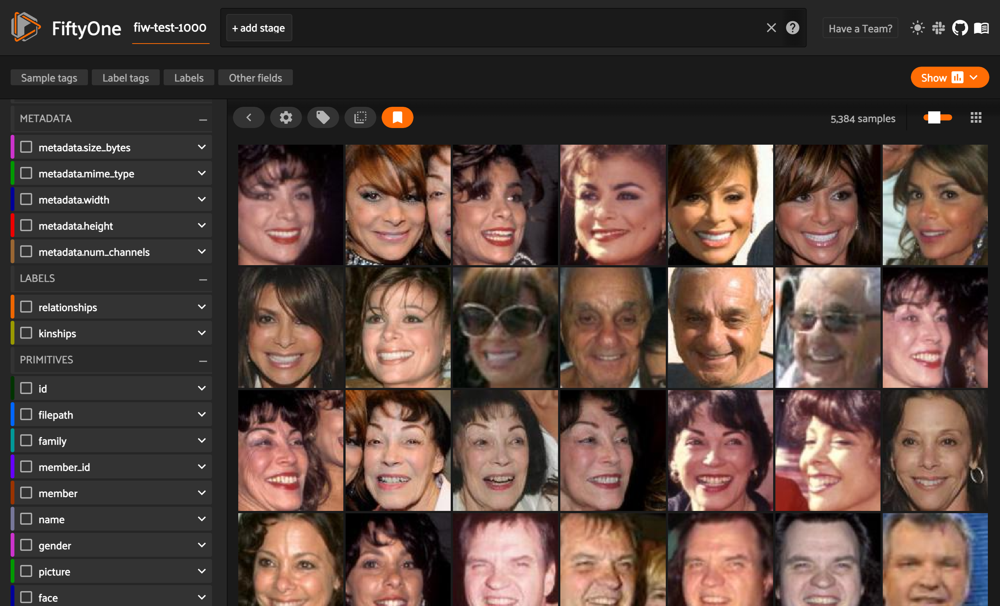

<IPython.core.display.Javascript object>

In [3]:
import fiftyone as fo
session= fo.launch_app(df)

In [4]:
model= foz.load_zoo_model("mobilenet-v2-imagenet-torch")
embeddings= df.compute_embeddings(model)

print(embeddings.shape)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


 100% |███████████████| 5384/5384 [5.3m elapsed, 0s remaining, 17.4 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5384/5384 [5.3m elapsed, 0s remaining, 17.4 samples/s]      


(5384, 1280)


In [5]:
from sklearn.metrics.pairwise import cosine_similarity
similarity_matrix = cosine_similarity(embeddings)

print(similarity_matrix.shape)

# The N x N similarity matrix provides a value between 0 (low similarity) and 1 (identical) for each pair of your N samples

(5384, 5384)


In [6]:
import numpy as np

n=len(similarity_matrix)
similarity_matrix= similarity_matrix- np.identity(n)

In [7]:
id_map = [s.id for s in df.select_fields(["id"])]
#creates a list called id_map that contains the id field for each element in the dataset.
#The id_map list will contain the id field for each element in the dataset. For example, if the dataset object contains 10 elements, the id_map list will contain 10 elements, one for each element in the dataset
for idx, sample in enumerate(df):
  max_similarity= similarity_matrix[idx].max()
  sample["max_similarity"]= max_similarity
  sample.save()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


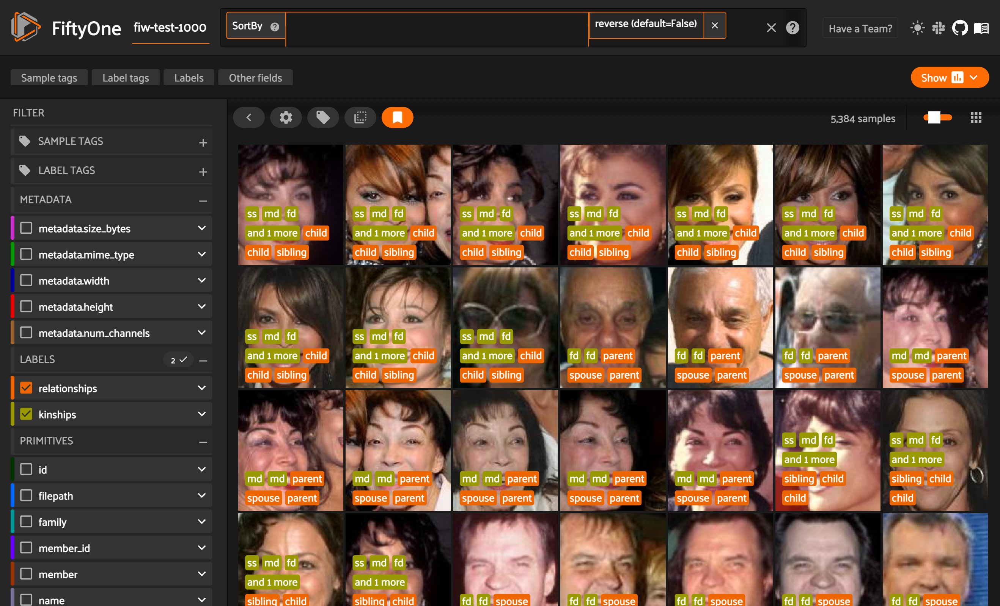

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


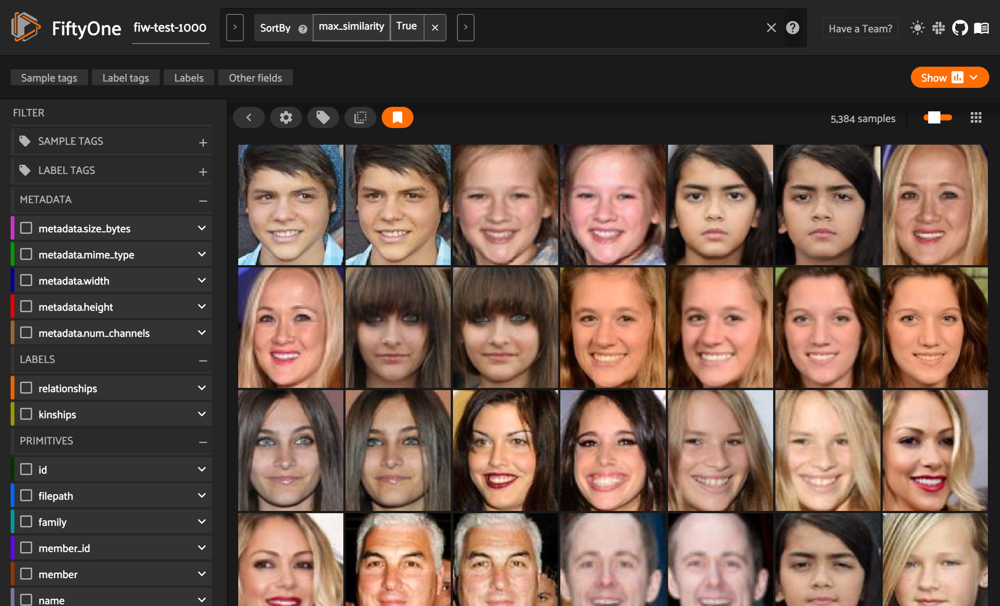

<IPython.core.display.Javascript object>

In [8]:
session.show()

In [9]:
df.match(F("max_similarity")>0.88)

Dataset:     fiw-test-1000
Media type:  image
Num samples: 4443
Sample fields:
    id:             fiftyone.core.fields.ObjectIdField
    filepath:       fiftyone.core.fields.StringField
    tags:           fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:       fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    family:         fiftyone.core.fields.StringField
    member_id:      fiftyone.core.fields.IntField
    member:         fiftyone.core.fields.StringField
    name:           fiftyone.core.fields.StringField
    gender:         fiftyone.core.fields.StringField
    picture:        fiftyone.core.fields.StringField
    face:           fiftyone.core.fields.StringField
    identifier:     fiftyone.core.fields.StringField
    face_id:        fiftyone.core.fields.IntField
    relationships:  fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Classifications)
    kinships:       fiftyone.core.fields.EmbeddedDocume

In [10]:
thresh = 0.88
samples_to_remove = set()
samples_to_keep = set()

for idx, sample in enumerate(df):
    if sample.id not in samples_to_remove:
        # Keep the first instance of two duplicates
        samples_to_keep.add(sample.id)
        
        dup_idxs = np.where(similarity_matrix[idx] > thresh)[0]
        for dup in dup_idxs:
            # We kept the first instance so remove all other duplicates
            samples_to_remove.add(id_map[dup])

        if len(dup_idxs) > 0:
            sample.tags.append("has_duplicates")
            sample.save()

    else:
        sample.tags.append("duplicate")
        sample.save()

print(len(samples_to_remove) + len(samples_to_keep))


5384


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


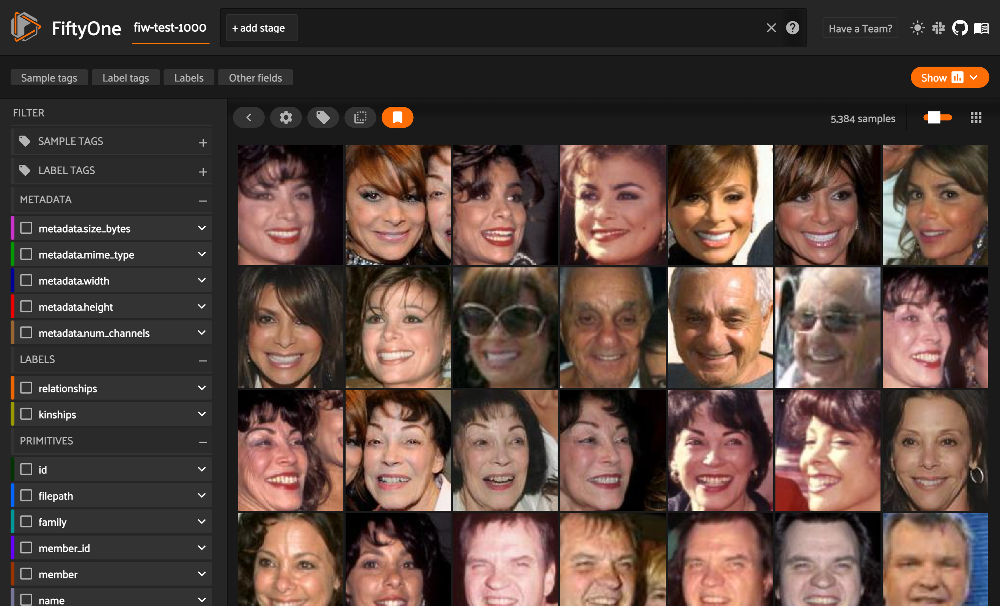

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


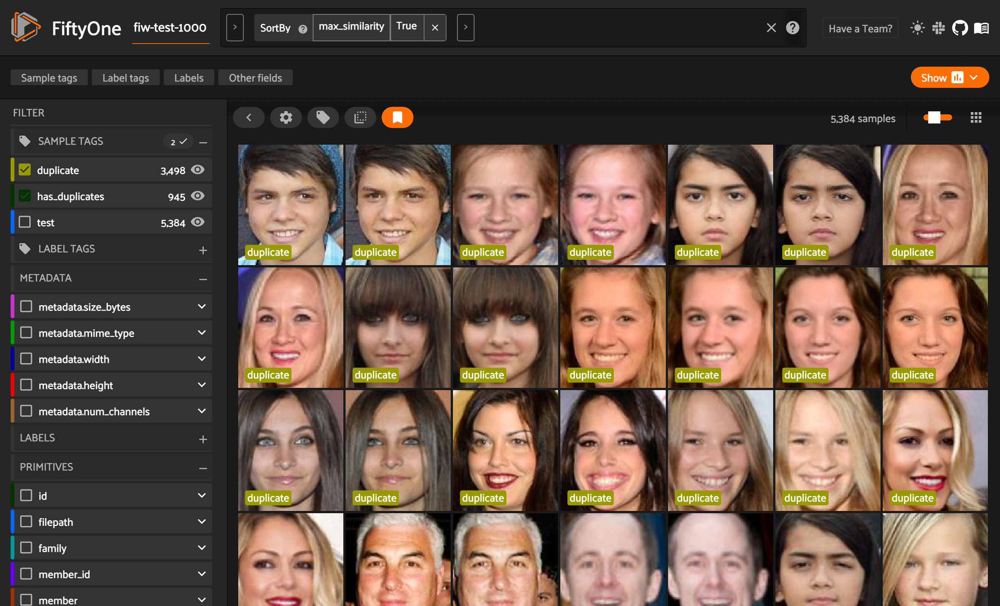

<IPython.core.display.Javascript object>

In [11]:
 session.show()

In [13]:
df.remove_samples(list(samples_to_remove))

<ipython-input-13-9e4561cbfadc>:1: DeprecationWarning: Call to deprecated method remove_samples. (Use delete_samples() instead)
  df.remove_samples(list(samples_to_remove))


In [14]:
session.show()